
<h2 align="center" style="color:brown;font-size:200%"><b>Lab 8: Edge Detection Techniques</b></h2>

## **Introduction:**

Edge detection is a cornerstone of image processing and computer vision, enabling the identification of object boundaries and significant transitions within an image. It is widely used in applications such as object detection, image segmentation, and feature extraction, where understanding the structural composition of images is vital. The process focuses on detecting regions of rapid intensity changes, which correspond to the edges of objects, thereby simplifying the image while retaining its essential features. This technique is critical in reducing computational complexity and enhancing interpretability, especially in scenarios where precise object outlines are required.

Various edge detection methods have been developed, each tailored to specific requirements and image characteristics. These include gradient-based techniques, which focus on first-order derivatives to detect edges, and Laplacian-based methods, which employ second-order derivatives to highlight intensity changes. Edge detection is not only a preprocessing step but also a foundation for advanced tasks like contour detection, texture analysis, and 3D reconstruction.

This study aims to delve into different edge detection techniques, implement them on sample images, and analyze their effectiveness through defined performance metrics. By comparing methods like Prewitt, Sobel, Robinson, Kirsch, and Laplacian edge detection, we intend to uncover their strengths, limitations, and best use cases in real-world applicaions.


## **Problem Statement:**

The diversity of edge detection techniques presents a significant challenge in selecting the most appropriate method for specific applications. Each technique is designed with unique principles and offers varying levels of effectiveness depending on factors such as image characteristics, noise levels, and task requirements. While some methods excel at detecting edges in images with high contrast, others are more suited for images with subtle intensity transitions.

This variation necessitates a comprehensive evaluation of edge detection methods to understand their strengths, weaknesses, and applicability to different scenarios. The primary objective of this project is to investigate and compare several widely-used edge detection techniques, assessing their performance using quantitative metrics. By doing so, we aim to provide meaningful insights into their behavior and suitability, enabling better decision-making for diverse image processing tasks.


## **Objectives:**

- To implement and analyze multiple edge detection techniques, including Prewitt, Sobel, Robinson, Kirsch, and Laplacian methods.  
- To evaluate the techniques based on performance metrics: edge pixel count, sharpness, and structural similarity index (SSIM).  
- To compare and interpret the results to identify the most effective technique for specific use cases.  
- To provide a detailed report on the findings, including conceptual understanding, methodology, and conclusions.  


## Concepts used:

1. **Prewitt Edge Detection:**  
   The Prewitt method is a gradient-based technique that detects edges by calculating the intensity gradients in the horizontal and vertical directions using convolution masks. It uses a pair of 3x3 kernels, one for detecting horizontal edges and the other for vertical edges. The magnitude of the gradient is computed by combining these two directions. The Prewitt method is computationally simple and efficient but can be sensitive to noise, often requiring preprocessing to reduce noise levels.

2. **Sobel Edge Detection:**  
   Similar to Prewitt, the Sobel method improves edge detection by incorporating weighted kernels, giving more importance to central pixels. This enhancement allows for smoother edges and better noise tolerance compared to the Prewitt method. The Sobel technique uses two 3x3 kernels to calculate the gradient in both horizontal and vertical directions, and then combines them to form the gradient magnitude. It is more effective at detecting smoother transitions in edges and is widely used in applications where edge quality and smoothness are important.

3. **Robinson Edge Detection:**  
   The Robinson method is a compass-based approach that detects edges in multiple directions—specifically in eight orientations (0°, 45°, 90°, 135°, etc.). By using eight convolution kernels, each corresponding to a specific direction, the Robinson technique identifies edges in any direction, making it highly effective for images with complex, multi-directional features. While it offers better directional sensitivity compared to Prewitt or Sobel, it is computationally more intensive because of the need to process multiple directions.

4. **Kirsch Edge Detection:**  
   The Kirsch method is an advanced form of compass-based edge detection. It uses eight directional masks to calculate the gradient in all primary compass directions, similar to the Robinson method. The mask that provides the highest response is chosen to represent the edge at that pixel. Kirsch is highly sensitive to rapid intensity changes and provides detailed edge information, making it suitable for detecting fine details and prominent edges in complex images. However, it is computationally expensive and prone to noise, requiring filtering before application.

5. **Laplacian Edge Detection:**  
   The Laplacian technique is a second-order derivative method used to detect edges by calculating the second derivative of the image intensity, highlighting both positive and negative intensity changes. This method uses a single convolution mask that responds to rapid intensity changes. The positive Laplacian emphasizes increasing intensity transitions, while the negative Laplacian highlights decreasing transitions. It is particularly effective for detecting subtle intensity variations but is highly sensitive to noise, often requiring smoothing techniques to improve accuracy.


In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import time

In [16]:
image = cv2.imread("image.png")

In [17]:
if len(image.shape) == 2:
    if np.unique(image).size <= 2:  # Only 0 and 1 for Binary
        print("Image is Binary")
    else:
        print("Image is Grayscale")
elif len(image.shape) == 3 and image.shape[2] == 3:
    print("Image is a Color Image")
    blue, green, red = cv2.split(image)  # OpenCV loads as BGR by default
    avg_blue = np.mean(blue)
    avg_green = np.mean(green)
    avg_red = np.mean(red)
    print(f"Channel Averages - Blue: {avg_blue}, Green: {avg_green}, Red: {avg_red}")
    if avg_red > avg_blue:
        print("Image is RGB")
    else:
        print("Image is BGR")
else:
    print("Image is Unknown")

Image is a Color Image
Channel Averages - Blue: 133.98979571812635, Green: 141.62484709930206, Red: 123.16272068394854
Image is BGR


### **Convert the image to RGB for proper visualization:**

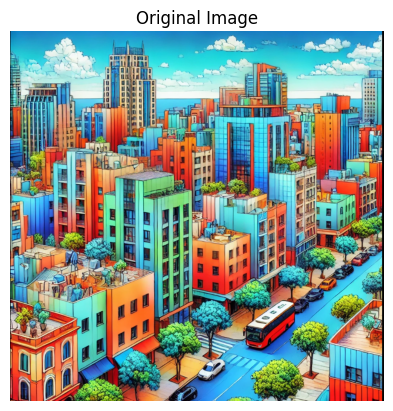

In [18]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the original image
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")
plt.show()

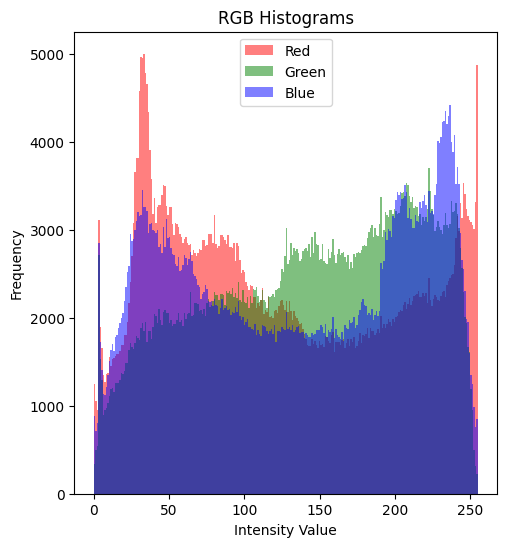

In [19]:
# Separate channels
r, g, b = cv2.split(image)

# Plot histograms for R, G, B channels
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.hist(r.ravel(), bins=256, color="red", alpha=0.5, label="Red")
plt.hist(g.ravel(), bins=256, color="green", alpha=0.5, label="Green")
plt.hist(b.ravel(), bins=256, color="blue", alpha=0.5, label="Blue")
plt.title("RGB Histograms")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()


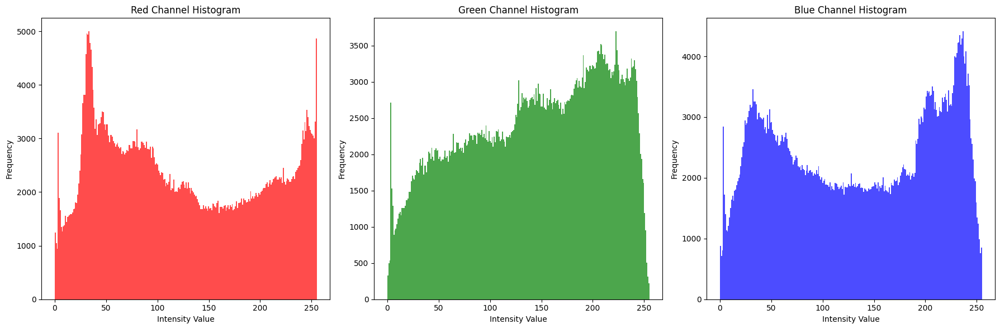

In [20]:
plt.figure(figsize=(18, 6))

# Red channel
plt.subplot(1, 3, 1)
plt.hist(r.ravel(), bins=256, color="red", alpha=0.7)
plt.title("Red Channel Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")

# Green channel
plt.subplot(1, 3, 2)
plt.hist(g.ravel(), bins=256, color="green", alpha=0.7)
plt.title("Green Channel Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")

# Blue channel
plt.subplot(1, 3, 3)
plt.hist(b.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Blue Channel Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


## **1) Prewitt Edge Detection:**

In [21]:
prewitt_kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

In [22]:
prewitt_edges_color = np.zeros_like(image)  # To store results
for i in range(3):  # Iterate over RGB channels
    edges_x = cv2.filter2D(image[:, :, i], -1, prewitt_kernel_x)
    edges_y = cv2.filter2D(image[:, :, i], -1, prewitt_kernel_y)
    prewitt_edges_color[:, :, i] = cv2.addWeighted(edges_x, 0.5, edges_y, 0.5, 0)

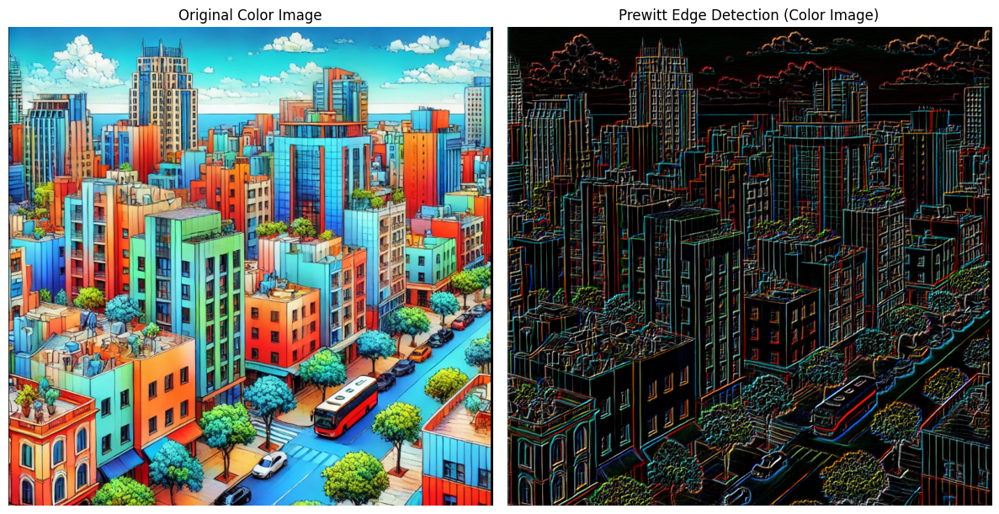

In [23]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Color Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(prewitt_edges_color)
plt.title("Prewitt Edge Detection (Color Image)")
plt.axis("off")

plt.tight_layout()
plt.show()

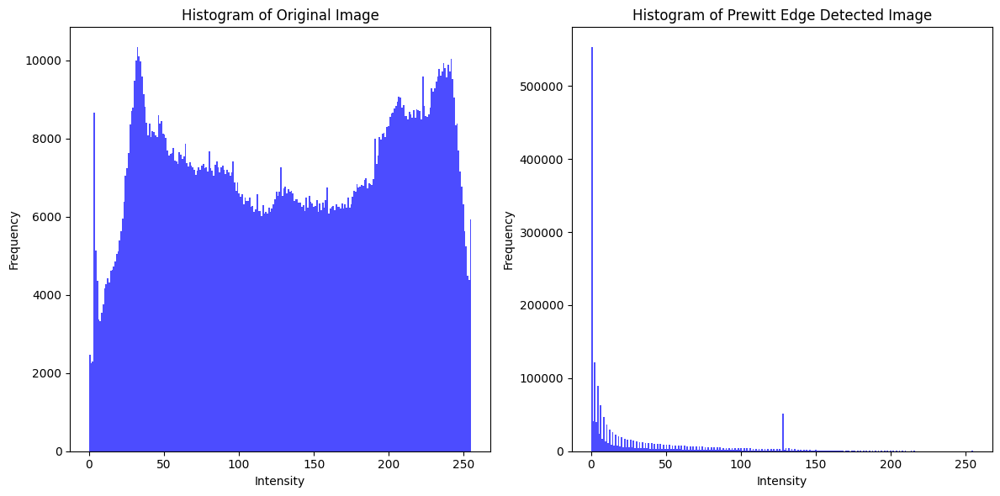

In [98]:
plt.figure(figsize=(12, 6))

# Histogram of the original image
plt.subplot(1, 2, 1)
plt.hist(image.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

# Histogram of Prewitt Edge detected image
plt.subplot(1, 2, 2)
plt.hist(prewitt_edges_color.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Prewitt Edge Detected Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


## **Interpretation:**
- The original image histogram shows the distribution of pixel brightness, while the Prewitt histogram shows the distribution of edge strengths.  
- The original histogram typically has a wider spread of values, representing the variety of tones in the image; the Prewitt histogram is heavily concentrated at zero, indicating most pixels are not part of an edge.  
- Peaks in the original histogram represent dominant brightness levels; peaks (excluding the one at zero) in the Prewitt histogram represent strong edges.  
- The original histogram's shape is generally complex, reflecting the image's tonal composition; the Prewitt histogram's shape is highly skewed, dominated by the zero value.  
- The original histogram provides information about overall brightness and contrast; the Prewitt histogram provides information about edge location and strength.  
- The original histogram represents the image before edge detection; the Prewitt histogram represents the result of the edge detection process, showing the transformation from tonal information to edge information.  
- The original histogram reflects the image's tonal content; the Prewitt histogram reflects the image's structural content.  
- The Prewitt histogram emphasizes the edges by highlighting the relatively few pixels with non-zero values, while the original histogram shows the distribution of all pixel intensities.  
- The large peak at zero in the Prewitt histogram indicates the background of the edge-detected image, not an edge itself.  
- The Prewitt histogram demonstrates the effect of the edge detection algorithm by showing the shift from a broad distribution of intensities to a highly concentrated distribution at zero.


## **Performance Metrics:**

In [49]:
edge_pixel_count_pre = np.sum(prewitt_edges > 0) # Metric 1: Edge Pixel Count for Prewitt Edge Detection

sharpness_pre = np.std(prewitt_edges) # Metric 2: Edge Sharpness (Contrast) for Prewitt Edge Detection

ssim_index_pre = 0 # Metric 3: Structural Similarity Index (SSIM) for Prewitt Edge Detection
for i in range(3):  
    channel_original = image[:, :, i]
    channel_edges = prewitt_edges[:, :, i]
    ssim_channel = ssim(channel_original, channel_edges, data_range=channel_edges.max() - channel_edges.min(), multichannel=False)
    ssim_index_pre += ssim_channel
ssim_index_pre /= 3 


In [50]:
print(f"Performance Metrics for Prewitt Edge Detection:")
print(f"1. Edge Pixel Count: {edge_pixel_count_pre}")
print(f"2. Edge Sharpness (Contrast): {sharpness_pre:.2f}")
print(f"3. Structural Similarity Index (SSIM): {ssim_index_pre:.4f}")

Performance Metrics for Prewitt Edge Detection:
1. Edge Pixel Count: 1281535
2. Edge Sharpness (Contrast): 43.11
3. Structural Similarity Index (SSIM): 0.0195


## **Insights:**
1. **Edge Pixel Count: 1281535** : Indicates a moderate level of edge detection, suggesting sensitivity to gradients with fewer edges compared to other methods.
2. **Edge Sharpness (Contrast): 43.11**: Highlights relatively low contrast in detected edges, which may result in less-defined boundaries.
3. **Structural Similarity Index (SSIM): 0.0195** : Positive but very low SSIM value suggests limited structural similarity to the original image, focusing primarily on edge content.

## **2) Sobel Edge Detection:**

In [32]:
sobel_edges_color = np.zeros_like(image)  # To store results
for i in range(3):  # Apply Sobel for each RGB channel
    edges_x = cv2.Sobel(image[:, :, i], cv2.CV_64F, 1, 0, ksize=3)
    edges_y = cv2.Sobel(image[:, :, i], cv2.CV_64F, 0, 1, ksize=3)
    sobel_edges_color[:, :, i] = cv2.addWeighted(np.abs(edges_x), 0.5, np.abs(edges_y), 0.5, 0)

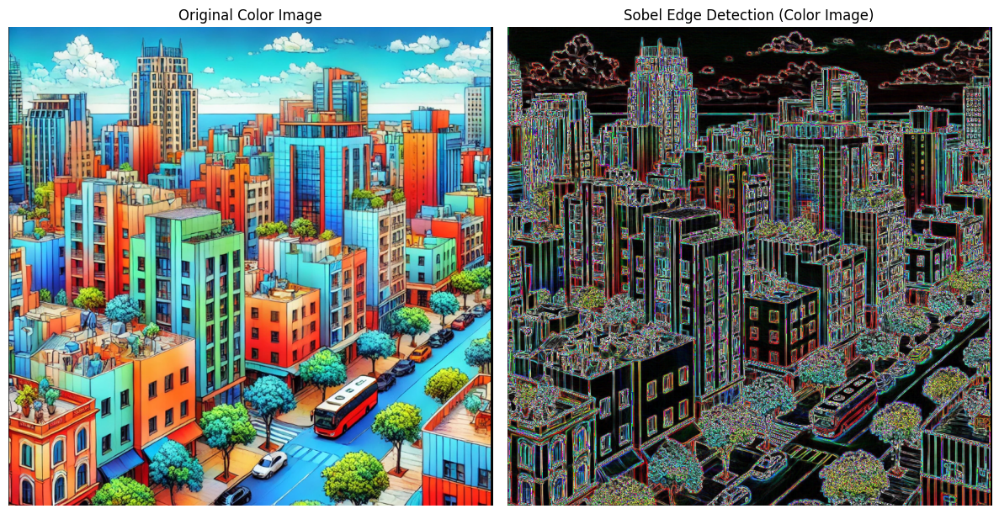

In [33]:
# Display Original and Sobel Edge-Detected Images Side by Side
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Color Image")
plt.axis("off")

# Sobel edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(sobel_edges_color.astype('uint8'))
plt.title("Sobel Edge Detection (Color Image)")
plt.axis("off")

plt.tight_layout()
plt.show()


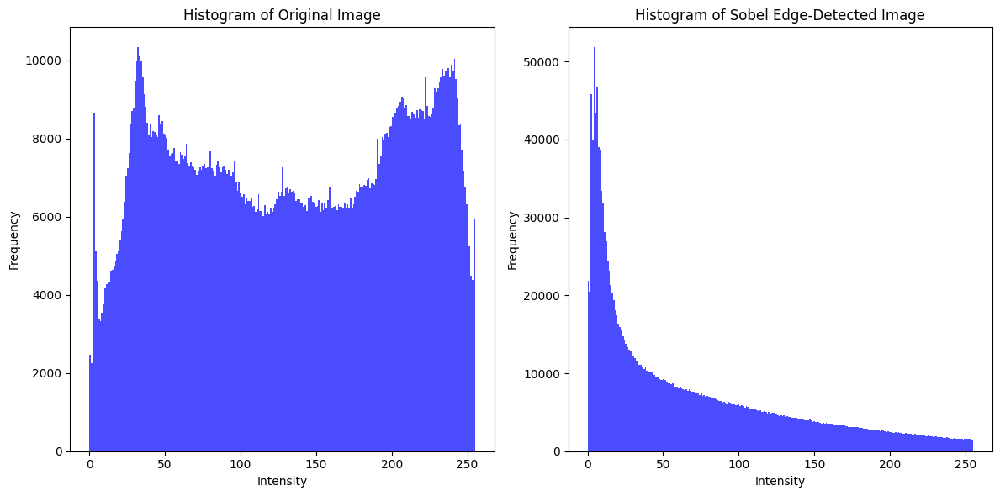

In [35]:
plt.figure(figsize=(12, 6))

# Histogram of the original image
plt.subplot(1, 2, 1)
plt.hist(image.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

# Histogram of Sobel edge-detected image
plt.subplot(1, 2, 2)
plt.hist(sobel_edges_color.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Sobel Edge-Detected Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


## **Interpretation:**
- The original image histogram shows the distribution of pixel brightness, while the Sobel edge-detected histogram shows the distribution of edge strengths.
- The original histogram typically has a wider spread of values, representing the variety of tones in the image; the Sobel histogram is heavily concentrated at zero, indicating most pixels are not part of an edge.
- Peaks in the original histogram represent dominant brightness levels; peaks (excluding the one at zero) in the Sobel histogram represent strong edges.
- The original histogram's shape is generally complex, reflecting the image's tonal composition; the Sobel histogram's shape is highly skewed, dominated by the zero value.
- The original histogram provides information about overall brightness and contrast; the Sobel histogram provides information about edge location and strength.
- The original histogram represents the image before edge detection; the Sobel histogram represents the result of the edge detection process, showing the transformation from tonal information to edge information.
- The original histogram reflects the image's tonal content; the Sobel histogram reflects the image's structural content.
- The Sobel histogram emphasizes the edges by highlighting the relatively few pixels with non-zero values, while the original histogram shows the distribution of all pixel intensities.
- The large peak at zero in the Sobel histogram indicates the background of the edge-detected image, not an edge itself.
- The Sobel histogram demonstrates the effect of the edge detection algorithm by showing the shift from a broad distribution of intensities to a highly concentrated distribution at zero.


## **Performacne Metrics:**

In [54]:
edge_pixel_count_sobel = np.sum(sobel_edges_color > 0)  # Metric 1: Edge Pixel Count for Sobel Edge Detection

sharpness_sobel = np.std(sobel_edges_color) # Metric 2: Edge Sharpness (Contrast) for Sobel Edge Detection

ssim_index_sobel = 0 # Metric 3: Structural Similarity Index (SSIM) for Sobel Edge Detection
for i in range(3):  
    channel_original = image[:, :, i]
    channel_edges = sobel_edges_color[:, :, i]
    ssim_channel = ssim(channel_original, channel_edges, data_range=channel_edges.max() - channel_edges.min(), multichannel=False)
    ssim_index_sobel += ssim_channel
ssim_index_sobel /= 3 

In [60]:
print(f"Performance Metrics for Sobel Edge Detection:")
print(f"1. Edge Pixel Count: {edge_pixel_count_sobel}")
print(f"2. Edge Sharpness (Contrast): {sharpness_sobel:.2f}")
print(f"3. Structural Similarity Index (SSIM): {ssim_index_sobel:.4f}")

Performance Metrics for Sobel Edge Detection:
1. Edge Pixel Count: 1812707
2. Edge Sharpness (Contrast): 65.91
3. Structural Similarity Index (SSIM): -0.0066


## **Insights:**
1. **Edge Pixel Count: 1812707** :Detects significantly more edges than Prewitt, indicating higher sensitivity to gradient changes.
2. **Edge Sharpness (Contrast): 65.91**:Higher contrast compared to Prewitt, showing well-defined and prominent edges.
3. **Structural Similarity Index (SSIM): -0.0066** :Negative SSIM value indicates minimal resemblance to the original structure, emphasizing edge extraction.

## **3) Robinson Compass Edge Detection:**

In [39]:
robinson_kernels = [
    np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]),  # East
    np.array([[0, 1, 2], [-1, 0, 1], [-2, -1, 0]]),  # North-East
    np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]),  # North
    np.array([[2, 1, 0], [1, 0, -1], [0, -1, -2]]),  # North-West
    np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]]),  # West
    np.array([[0, -1, -2], [1, 0, -1], [2, 1, 0]]),  # South-West
    np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]),  # South
    np.array([[-2, -1, 0], [-1, 0, 1], [0, 1, 2]])   # South-East
]

In [40]:
robinson_edges_color = np.zeros_like(image, dtype=np.float64)
for i in range(3):  # Loop through RGB channels
    max_edges = np.zeros_like(image[:, :, i], dtype=np.float64)
    for kernel in robinson_kernels:
        edges = cv2.filter2D(image[:, :, i], -1, kernel)
        max_edges = np.maximum(max_edges, edges)  # Retain maximum response
    robinson_edges_color[:, :, i] = max_edges

robinson_edges_color = np.clip(robinson_edges_color, 0, 255).astype('uint8')

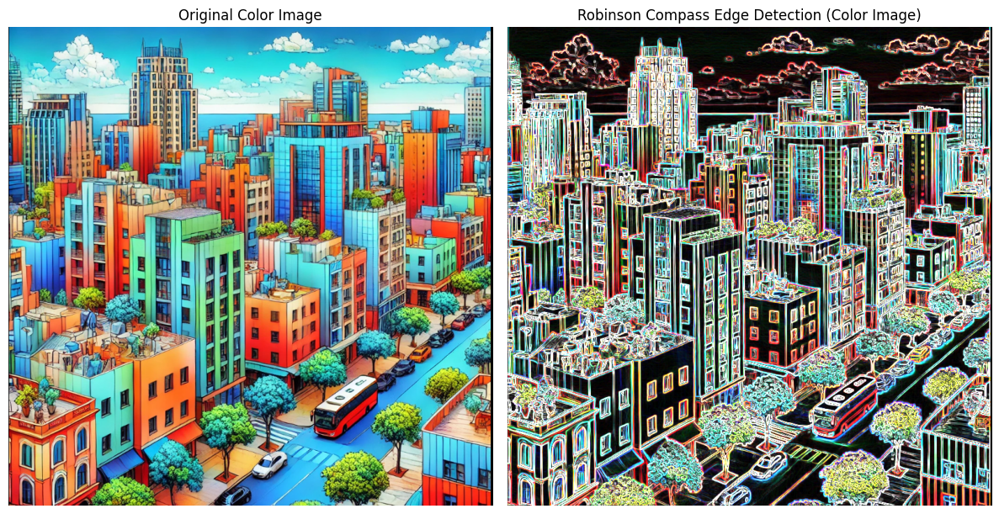

In [41]:
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Color Image")
plt.axis("off")

# Robinson edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(robinson_edges_color)
plt.title("Robinson Compass Edge Detection (Color Image)")
plt.axis("off")

plt.tight_layout()
plt.show()


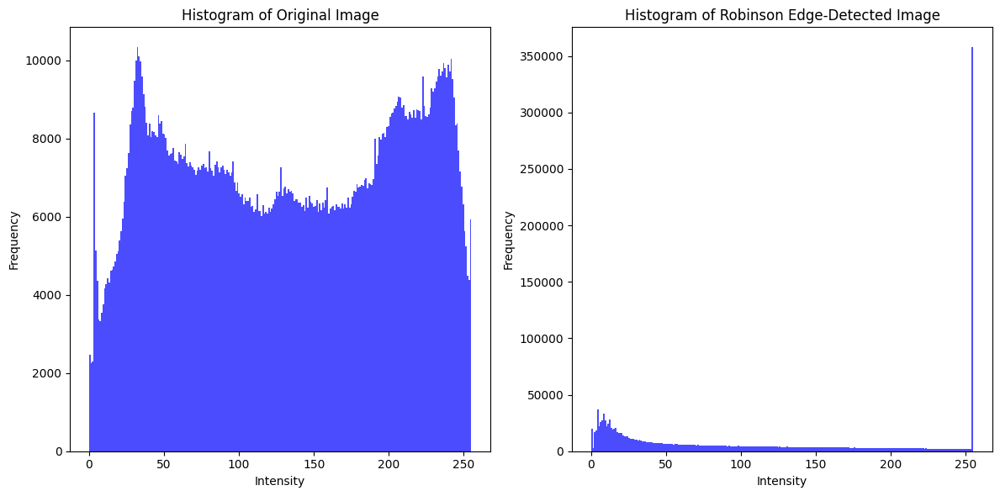

In [43]:
plt.figure(figsize=(12, 6))

# Histogram of the original image
plt.subplot(1, 2, 1)
plt.hist(image.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

# Histogram of Robinson edge-detected image
plt.subplot(1, 2, 2)
plt.hist(robinson_edges_color.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Robinson Edge-Detected Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


## **Interpretation:**
- The original image histogram shows the distribution of pixel intensities (brightness), while the Robinson edge-detected histogram shows the distribution of edge strengths.
- The original histogram exhibits a broader spread of intensity values, indicating a variety of tones in the image; the Robinson histogram is highly concentrated at zero, showing most pixels are not part of a detected edge.
- Peaks in the original histogram represent frequently occurring intensity values, corresponding to prominent tones; in the Robinson histogram, the large peak at zero represents the background, while smaller peaks at higher intensities (if present) would indicate stronger edges.
- The shape of the original histogram is more complex and varied, reflecting the image's tonal composition; the Robinson histogram has a characteristic highly skewed shape, dominated by the peak at zero.
- The original histogram provides information about the image's overall brightness, contrast, and dynamic range; the Robinson histogram provides information about the location and magnitude of edges.
- The original histogram represents the image *before* edge detection; the Robinson histogram represents the *result* of applying the Robinson edge detection operator.
- The original histogram reflects the tonal content of the image; the Robinson histogram reflects the structural or edge-based content.
- The Robinson histogram emphasizes the edge pixels by showing their distribution, while the original histogram shows the distribution of all pixel intensities regardless of whether they are part of an edge.
- The Robinson histogram has a notable spike at 255. This is likely due to the way the edge detection algorithm handles very strong edges, often clipping the values to the maximum intensity. This is a key difference compared to the previous examples and indicates a characteristic of the Robinson operator's implementation.
- The shift from the original histogram to the Robinson histogram visually demonstrates the effect of the edge detection process: a transformation from a distribution of tones to a distribution of edge strengths.

## **Performance Metrics:**

In [57]:
edge_pixel_count_robinson = np.sum(robinson_edges_color > 0)  # Metric 1: Edge Pixel Count for Robinson Edge Detection

sharpness_robinson = np.std(robinson_edges_color)  # Metric 2: Edge Sharpness (Contrast) for Robinson Edge Detection

ssim_index_robinson = 0 # Metric 3: Structural Similarity Index (SSIM) for Robinson Edge Detection
for i in range(3):  # Compute SSIM for each channel and average
    channel_original = image[:, :, i]
    channel_edges = robinson_edges_color[:, :, i]  
    ssim_channel = ssim(channel_original, channel_edges, data_range=channel_edges.max() - channel_edges.min(), multichannel=False)
    ssim_index_robinson += ssim_channel

ssim_index_robinson /= 3 

In [59]:
print(f"Performance Metrics for Robinson Edge Detection:")
print(f"1. Edge Pixel Count: {edge_pixel_count_robinson}")
print(f"2. Edge Sharpness (Contrast): {sharpness_robinson:.2f}")
print(f"3. Structural Similarity Index (SSIM): {ssim_index_robinson:.4f}")

Performance Metrics for Robinson Edge Detection:
1. Edge Pixel Count: 1814893
2. Edge Sharpness (Contrast): 95.24
3. Structural Similarity Index (SSIM): -0.0217


## **Insights:**
1. **Edge Pixel Count: 1814893**: Similar to Sobel, with slightly higher edge pixel count, capturing finer edge details.
2. **Edge Sharpness (Contrast): 95.24**: Shows the highest sharpness, making it ideal for detecting clear and strong edges.
3. **Structural Similarity Index (SSIM): -0.0217** : Lowest SSIM among the three methods, indicating a greater focus on edge representation than original structural resemblance.

## **4) Kirsch Compass Edge Detection:**

In [63]:
# Kirsch Compass Masks (8 Directions)
kirsch_kernels = [
    np.array([[5, 5, 5], [-3, 0, -3], [-3, -3, -3]]),  # 0 degrees
    np.array([[5, 5, -3], [5, 0, -3], [-3, -3, -3]]),  # 45 degrees
    np.array([[-3, 5, 5], [-3, 0, 5], [-3, -3, -3]]),  # 90 degrees
    np.array([[-3, -3, 5], [-3, 0, 5], [-3, -3, -3]]),  # 135 degrees
    np.array([[-3, -3, -3], [5, 0, -3], [5, 5, 5]]),  # 180 degrees
    np.array([[-3, -3, -3], [-3, 0, 5], [5, 5, -3]]),  # 225 degrees
    np.array([[-3, -3, -3], [-3, 0, -3], [5, 5, 5]]),  # 270 degrees
    np.array([[-3, -3, -3], [-3, 0, -3], [-3, 5, 5]])   # 315 degrees
]

edges_kirsch = np.zeros_like(image, dtype=float)

for kernel in kirsch_kernels:
    for i in range(3):  # Iterate over RGB channels
        edges_kirsch[:, :, i] += cv2.filter2D(image[:, :, i], -1, kernel)

edges_kirsch = np.uint8(np.abs(edges_kirsch))

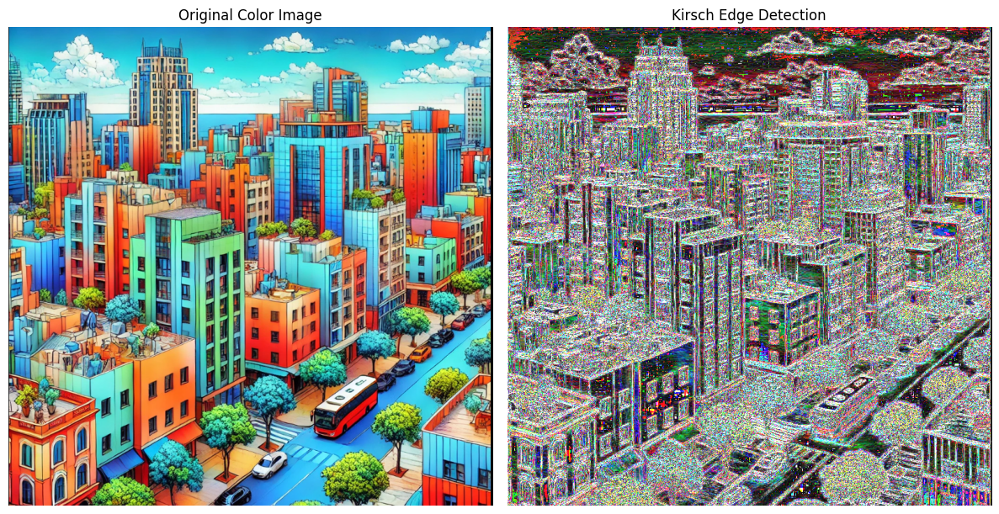

In [65]:
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Color Image")
plt.axis("off")

# Sobel edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(edges_kirsch)
plt.title("Kirsch Edge Detection")
plt.axis('off')

plt.tight_layout()
plt.show()


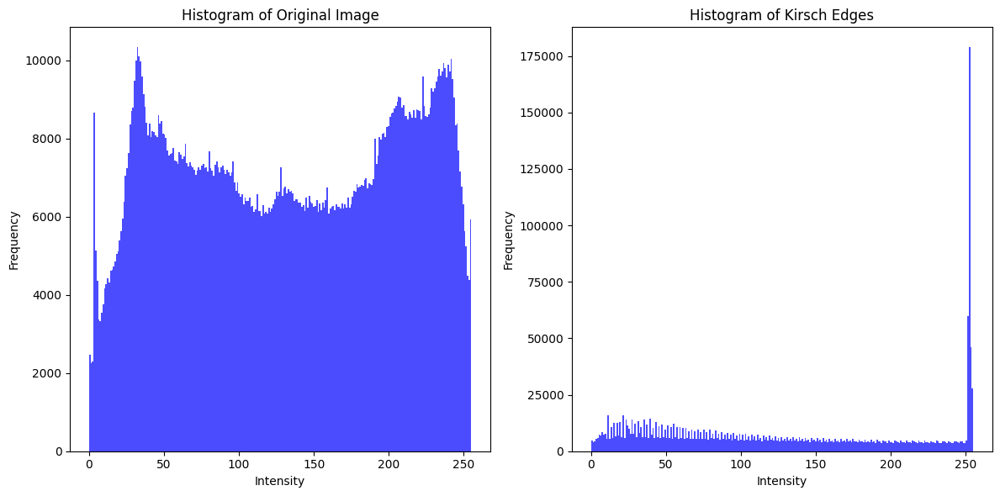

In [101]:
plt.figure(figsize=(12, 6))

# Histogram of the original image
plt.subplot(1, 2, 1)
plt.hist(image.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

# Histogram of Robinson edge-detected image
plt.subplot(1, 2, 2)
plt.hist(edges_kirsch.ravel(), bins=256, color='blue', alpha=0.7)
plt.title("Histogram of Kirsch Edges")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


## **Interpretation:**
* The original image histogram shows the distribution of pixel intensities (brightness); the Kirsch edge-detected histogram shows the distribution of edge strengths.
* The original histogram has a broader range and more even distribution of values, indicating various tones; the Kirsch histogram is concentrated at zero, showing most pixels are not part of detected edges.
* Peaks in the original histogram represent frequent intensity values (tones); in the Kirsch histogram, the peak at zero is the background, other peaks (if any) are stronger edges.
* The original histogram's shape is complex, reflecting the image's tonal composition; the Kirsch histogram is highly skewed, dominated by the zero peak (typical for edge detection).
* The original histogram shows overall brightness, contrast, and dynamic range; the Kirsch histogram shows edge location and magnitude (structural content).
* The original histogram is the image *before* edge detection (all pixel intensities); the Kirsch histogram is the *result* of Kirsch edge detection (edge strengths).
* The shift from the original to the Kirsch histogram demonstrates the edge detection effect: a transformation from tonal distribution to edge strength distribution.
* The original histogram reflects tonal content; the Kirsch histogram reflects structural content (edges).
* The Kirsch histogram emphasizes edge pixels; the original histogram shows all pixel intensities.
* The Kirsch histogram has a pronounced spike at 255, indicating clipping of strong edge values to the maximum intensity, a characteristic of this operator's implementation.



## **Performance Metrics:**

In [68]:
edge_pixel_count_kirsch = np.sum(edges_kirsch > 0)# Metric 1: Edge Pixel Count

sharpness_kirsch = np.std(edges_kirsch) # Metric 2: Edge Sharpness (Contrast)

ssim_index_kirsch = 0 # Metric 3: Structural Similarity Index (SSIM)

for i in range(3):  # Compute SSIM for each RGB channel and average
    channel_original = image[:, :, i]
    channel_edges = edges_kirsch[:, :, i]
    ssim_channel = ssim(channel_original, channel_edges, data_range=channel_edges.max() - channel_edges.min(), multichannel=False)
    ssim_index_kirsch += ssim_channel

ssim_index_kirsch /= 3  # Average across all RGB channels

In [99]:
print(f"Performance Metrics for Kirsch Compass Edge Detection:")
print(f"Edge Pixel Count (Kirsch): {edge_pixel_count_kirsch}")
print(f"Sharpness (Kirsch): {sharpness_kirsch}")
print(f"SSIM Index (Kirsch): {ssim_index_kirsch}")

Performance Metrics for Kirsch Compass Edge Detection:
Edge Pixel Count (Kirsch): 1829782
Sharpness (Kirsch): 85.56105487046887
SSIM Index (Kirsch): -0.024878120316456306


## **Insights:**
1. **Edge Pixel Count: 1829782**: Highest edge pixel count, reflecting the method’s high sensitivity to directional changes in gradients.
2. **Sharpness: 85.56**:Indicates sharp and prominent edges, though slightly less than Robinson.
3. **SSIM Index: -0.0249**:Low SSIM value underscores its strong edge-focused nature, diverging significantly from the original image structure.

## **5)Laplacian Edge Detection:**

## **a)Positive Laplacian Edge Detection:**

In [88]:
# **Positive Laplacian Edge Detection**
laplacian_pos = np.zeros_like(image, dtype=np.float64)

# Apply Laplacian separately for each channel (R, G, B)
for i in range(3):  
    laplacian_pos[:, :, i] = cv2.Laplacian(image[:, :, i], cv2.CV_64F)

# Convert to absolute and 8-bit image for visualization
laplacian_pos = np.uint8(np.absolute(laplacian_pos))

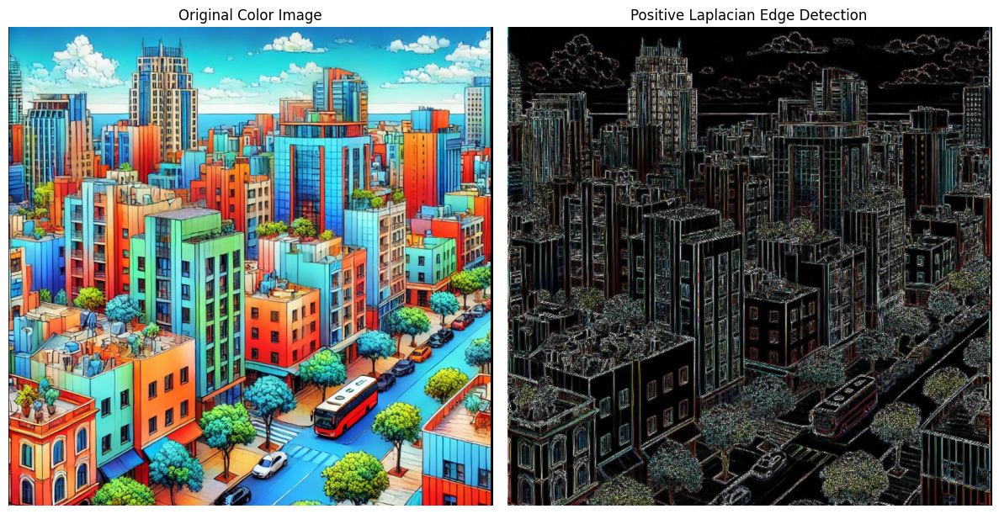

In [89]:
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Color Image")
plt.axis("off")

# Positive Laplacian edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(laplacian_pos)
plt.title("Positive Laplacian Edge Detection")
plt.axis('off')

plt.tight_layout()
plt.show()

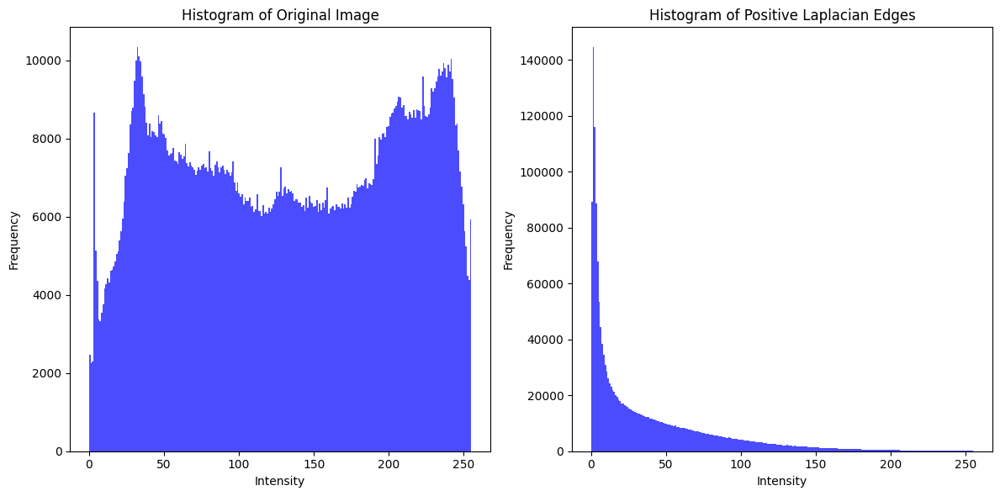

In [90]:
plt.figure(figsize=(12, 6))

# Histogram of the original image
plt.subplot(1, 2, 1)
plt.hist(image.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

# Histogram of Positive Laplacian edge-detected image
plt.subplot(1, 2, 2)
plt.hist(laplacian_pos.ravel(), bins=256, color='blue', alpha=0.7)
plt.title("Histogram of Positive Laplacian Edges")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

## **Interpretation:**
* The original image histogram shows the distribution of pixel intensities (brightness); the positive Laplacian edge histogram shows the distribution of edge responses (specifically, positive Laplacian values).
* The original histogram displays a broader range and more varied distribution of values, indicating a variety of tones; the positive Laplacian histogram is heavily skewed towards zero, with a rapid decrease in frequency for higher values.
* In the original histogram, peaks represent dominant intensity levels (common tones); in the positive Laplacian histogram, the high peak at zero signifies a large number of pixels with no significant edge response, while the tail represents pixels identified as edges.
* The original histogram's shape is complex, reflecting the image's overall tonal composition; the positive Laplacian histogram has a characteristic J-shape, typical of edge detection results, especially those emphasizing edge transitions.
* The original histogram provides information about brightness, contrast, and dynamic range; the positive Laplacian histogram focuses on edge presence and strength, highlighting areas of rapid intensity change.
* The original histogram represents the image *before* edge detection (all pixel intensities); the positive Laplacian histogram represents the *result* of applying the positive Laplacian operator (edge responses).
* The shift from the original histogram to the positive Laplacian histogram demonstrates the effect of edge detection: a transformation from a distribution of tones to a distribution of edge responses.
* The original histogram reflects the image's tonal content; the positive Laplacian histogram reflects the image's structural content (edges).
* The positive Laplacian histogram highlights edge transitions (positive Laplacian values), while the original histogram shows the distribution of all pixel intensities, irrespective of edges.
* The presence of only positive Laplacian values implies that the edge detection process specifically focused on detecting transitions from dark to light areas (or vice-versa, depending on the specific Laplacian implementation). This is reflected in the lack of negative values in the right-hand histogram.


## **Performance Metrics:**

In [91]:
edge_pixel_count_pos = np.sum(np.any(laplacian_pos > 0, axis=2)) # Metric 1: Edge Pixel Count for Positive Laplacian

sharpness_pos = np.std(laplacian_pos) # Metric 2: Sharpness for Positive Laplacian

ssim_index_pos = 0 # Metric 3: Structural Similarity Index (SSIM) for Positive Laplacian

for i in range(3):
    channel_original = image[:, :, i]
    channel_edges = laplacian_pos[:, :, i]
    ssim_channel = ssim(
        channel_original, 
        channel_edges, 
        data_range=channel_edges.max() - channel_edges.min(),
        multichannel=False
    )
    ssim_index_pos += ssim_channel
ssim_index_pos /= 3

In [92]:
print("Analysis of Positive Laplacian Edge Detection:")
print(f"Edge Pixel Count (Positive Laplacian): {edge_pixel_count_pos}")
print(f"Sharpness (Positive Laplacian): {sharpness_pos}")
print(f"SSIM Index (Positive Laplacian): {ssim_index_pos}")

Analysis of Positive Laplacian Edge Detection:
Edge Pixel Count (Positive Laplacian): 606617
Sharpness (Positive Laplacian): 43.48947284441412
SSIM Index (Positive Laplacian): -0.06257167001294885


## **Insights:**
1. **Edge Pixel Count: 606617**:Lowest edge pixel count among all methods, suggesting a focus on broader transitions rather than fine details.
2. **Sharpness: 43.49**:Comparable sharpness to Prewitt, indicating moderately defined edges.
3. **SSIM Index: -0.0626**:Negative SSIM shows a notable divergence from the original structure, emphasizing second-order derivative changes.

## **b)Negative Laplacian Edge Detection:**

In [93]:
laplacian_neg = np.zeros_like(image, dtype=np.float64)
for i in range(3):  
    laplacian_neg[:, :, i] = -cv2.Laplacian(image[:, :, i], cv2.CV_64F)  # Negating the result
laplacian_neg = np.uint8(np.absolute(laplacian_neg))

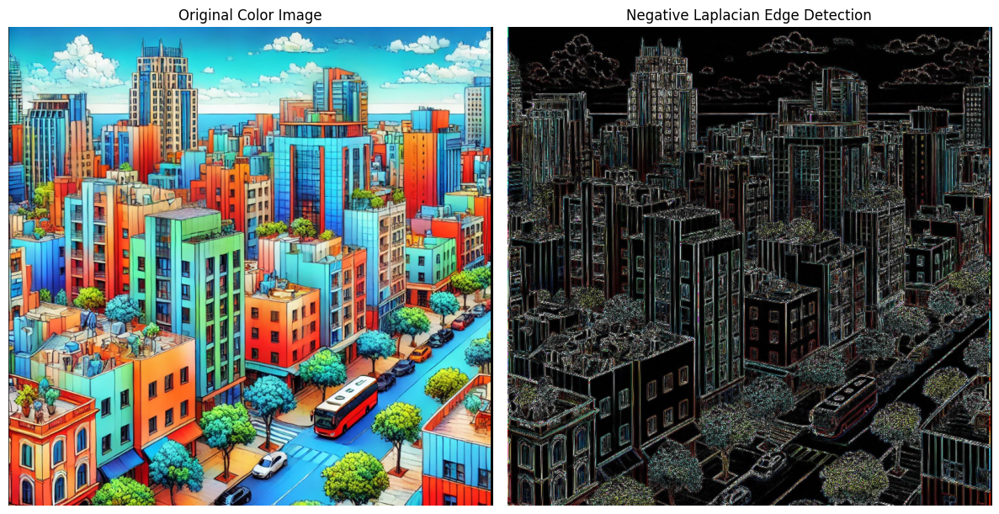

In [94]:
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original Color Image")
plt.axis("off")

# Negative Laplacian edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(laplacian_neg)
plt.title("Negative Laplacian Edge Detection")
plt.axis('off')

plt.tight_layout()
plt.show()

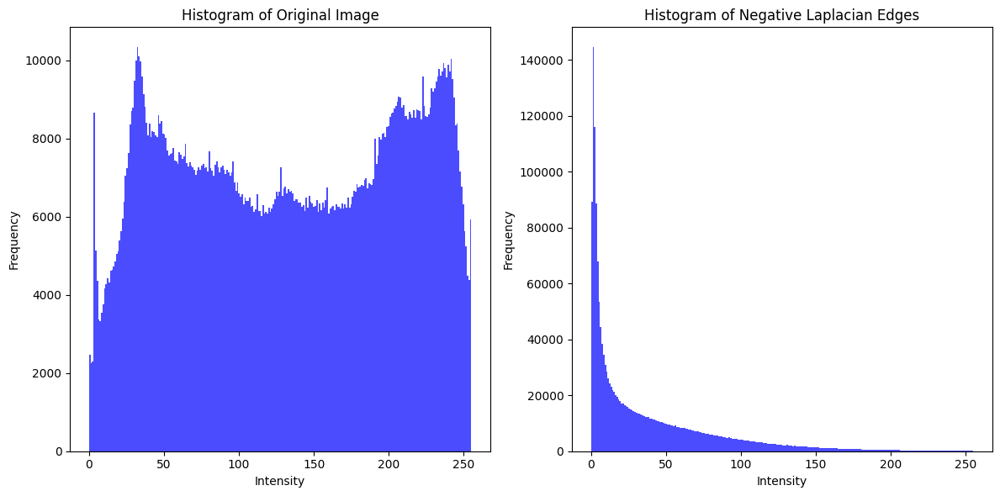

In [95]:
# **Histograms**
plt.figure(figsize=(12, 6))

# Histogram of the original image
plt.subplot(1, 2, 1)
plt.hist(image.ravel(), bins=256, color="blue", alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

# Histogram of Negative Laplacian edge-detected image
plt.subplot(1, 2, 2)
plt.hist(laplacian_neg.ravel(), bins=256, color='blue', alpha=0.7)
plt.title("Histogram of Negative Laplacian Edges")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

## **Interpretation:**
* The original image histogram shows the distribution of pixel intensities (brightness); the positive Laplacian edge histogram shows the distribution of edge responses (specifically, positive Laplacian values).
* The original histogram displays a broader range and more varied distribution of values, indicating a variety of tones; the positive Laplacian histogram is heavily skewed towards zero, with a rapid decrease in frequency for higher values.
* In the original histogram, peaks represent dominant intensity levels (common tones); in the positive Laplacian histogram, the high peak at zero signifies a large number of pixels with no significant edge response, while the tail represents pixels identified as edges.
* The original histogram's shape is complex, reflecting the image's overall tonal composition; the positive Laplacian histogram has a characteristic J-shape, typical of edge detection results, especially those emphasizing edge transitions.
* The original histogram provides information about brightness, contrast, and dynamic range; the positive Laplacian histogram focuses on edge presence and strength, highlighting areas of rapid intensity change.
* The original histogram represents the image *before* edge detection (all pixel intensities); the positive Laplacian histogram represents the *result* of applying the positive Laplacian operator (edge responses).
* The shift from the original histogram to the positive Laplacian histogram demonstrates the effect of edge detection: a transformation from a distribution of tones to a distribution of edge responses.
* The original histogram reflects the image's tonal content; the positive Laplacian histogram reflects the image's structural content (edges).
* The positive Laplacian histogram highlights edge transitions (positive Laplacian values), while the original histogram shows the distribution of all pixel intensities, irrespective of edges.
* The presence of only positive Laplacian values implies that the edge detection process specifically focused on detecting transitions from dark to light areas (or vice-versa, depending on the specific Laplacian implementation). This is reflected in the lack of negative values in the right-hand histogram.


In [96]:
edge_pixel_count_neg = np.sum(np.any(laplacian_neg > 0, axis=2)) # Metric 1: Edge Pixel Count for Negative Laplacian

sharpness_neg = np.std(laplacian_neg) # Metric 2: Sharpness for Negative Laplacian

ssim_index_neg = 0 # Metric 3: Structural Similarity Index (SSIM) for Negative Laplacian
for i in range(3):
    channel_original = image[:, :, i]
    channel_edges = laplacian_neg[:, :, i]
    ssim_channel = ssim(
        channel_original, 
        channel_edges, 
        data_range=channel_edges.max() - channel_edges.min(),
        multichannel=False
    )
    ssim_index_neg += ssim_channel
ssim_index_neg /= 3

In [97]:
print("Analysis of Negative Laplacian Edge Detection:")
print(f"Edge Pixel Count (Negative Laplacian): {edge_pixel_count_neg}")
print(f"Sharpness (Negative Laplacian): {sharpness_neg}")
print(f"SSIM Index (Negative Laplacian): {ssim_index_neg}")

Analysis of Negative Laplacian Edge Detection:
Edge Pixel Count (Negative Laplacian): 606617
Sharpness (Negative Laplacian): 43.48947284441412
SSIM Index (Negative Laplacian): -0.06257167001294885


## **Insights:**

1. **Edge Pixel Count: 606617**: Matches the Positive Laplacian, focusing on similar edge regions.
2. **Sharpness: 43.49** : Identical to Positive Laplacian, reflecting consistent edge sharpness characteristics.
3. **SSIM Index: -0.0626**:Identical SSIM to Positive Laplacian, indicating comparable structural deviation and focus on second-order derivatives.

## **Inference:**

- The comparison of edge detection techniques reveals a trade-off between edge detail and structural preservation. **Prewitt** emerges as a balanced performer, maintaining structural similarity with moderate sharpness and edge detection. This makes it suitable for applications where the integrity of the original image must remain intact, such as object recognition or medical imaging.

- On the other hand, **Robinson** and **Kirsch** demonstrate superior sharpness and edge detail, making them ideal for applications requiring precise and distinct edge extraction, such as feature detection in aerial imagery or texture analysis. However, their negative SSIM scores indicate a significant transformation of the original image, which may not be suitable for tasks demanding high fidelity to the original structure.

- The **Sobel** method stands as a middle ground, offering better sharpness and detail than Prewitt while still retaining some structural similarity, making it versatile for moderate-detail tasks. The **Laplacian** methods, both positive and negative, focus on highlighting only prominent edges, with a simplified representation of transitions. This is useful for tasks like boundary segmentation in computational graphics, where fine details are less critical.

- Thus, the choice of technique should align with the application’s requirements for detail, structure, and simplicity. For comprehensive edge extraction with an emphasis on detail, **Robinson** is the best choice, while **Prewitt** is optimal for preserving original image features.

## **Conclusion:**

Through this comparative study, we observed the strengths and limitations of each edge detection technique:

- **Prewitt** is well-suited for applications requiring structural preservation and moderate detail.  
- **Sobel** strikes a balance between edge detail and structural integrity, making it versatile for general purposes.  
- **Robinson** and **Kirsch** are ideal for high-detail tasks, although their structural fidelity is limited.  
- **Laplacian methods** are efficient for detecting prominent edges but lack the granularity needed for fine detail extraction.  

Ultimately, the best technique depends on the specific application:

- For tasks like object recognition, **Prewitt** is recommended.  
- For applications emphasizing edge detail, such as texture analysis, **Robinson** or **Kirsch** is optimal.

This study highlights the importance of aligning technique selection with task requirements, ensuring optimal performance in image processing workflows.  
